In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
config_df = pd.read_csv("../experiments/results/results.csv")
config_df.head()

,config_id,model_name,max_seq_len,batch_size,overlapping,epochs,learning_rate,training_time,peak_memory,test_mse,test_qwk,test_pearson,lora_rank,lora_alpha
0,0,google-bert/bert-base-multilingual-uncased,512,4,0.0,5,0.00001,2486.913152,5045.098145,0.023742,0.907672,0.916771,NaN,NaN
1,1,google-bert/bert-base-multilingual-uncased,512,4,0.0,5,0.00002,2494.716393,5045.723145,0.023860,0.904778,0.914676,NaN,NaN
2,2,google-bert/bert-base-multilingual-uncased,512,4,0.0,5,0.00005,2497.623863,5045.723145,0.027046,0.894627,0.914273,NaN,NaN
3,3,google-bert/bert-base-multilingual-uncased,512,4,0.0,10,0.00001,4980.188454,5345.226562,0.016765,0.927136,0.927738,NaN,NaN
4,4,google-bert/bert-base-multilingual-uncased,512,4,0.0,10,0.00002,4987.591906,5345.226562,0.017093,0.925040,0.925548,NaN,NaN


In [3]:
epoch_df = pd.read_csv("../experiments/results/results_epoch.csv")
epoch_df.head()

,config_id,epoch,train_mse,train_qwk,train_pearson,valid_mse,valid_qwk,valid_pearson
0,0,1,0.049350,0.640103,0.747895,0.024333,0.891453,0.893674
1,0,2,0.026322,0.731681,0.869789,0.019106,0.909073,0.914118
2,0,3,0.019488,0.770252,0.905043,0.021332,0.901535,0.905307
3,0,4,0.015357,0.791714,0.925888,0.018986,0.913423,0.917209
4,0,5,0.011620,0.819639,0.944403,0.025268,0.900590,0.910642


In [4]:
def format_overlapping(value):
    if pd.isna(value):
        return "truncate"
    return str(value)

results = {}

print("\n=== Top 10 Configurations by MSE (Lower is Better) ===")
top_mse = config_df.nsmallest(10, 'test_mse')[
    ['config_id', 'model_name', 'max_seq_len', 'batch_size', 
        'overlapping', 'epochs', 'learning_rate', 'test_mse']
].copy()
top_mse['overlapping'] = top_mse['overlapping'].apply(format_overlapping)
print(top_mse.to_string(index=False))

# Analyze QWK (higher is better)
print("\n=== Top 10 Configurations by QWK (Higher is Better) ===")
top_qwk = config_df.nlargest(10, 'test_qwk')[
    ['config_id', 'model_name', 'max_seq_len', 'batch_size', 
        'overlapping', 'epochs', 'learning_rate', 'test_qwk']
].copy()
top_qwk['overlapping'] = top_qwk['overlapping'].apply(format_overlapping)
print(top_qwk.to_string(index=False))

# Analyze Pearson (higher is better)
print("\n=== Top 10 Configurations by Pearson Correlation (Higher is Better) ===")
top_pearson = config_df.nlargest(10, 'test_pearson')[
    ['config_id', 'model_name', 'max_seq_len', 'batch_size', 
        'overlapping', 'epochs', 'learning_rate', 'test_pearson']
].copy()
top_pearson['overlapping'] = top_pearson['overlapping'].apply(format_overlapping)
print(top_pearson.to_string(index=False))


=== Top 10 Configurations by MSE (Lower is Better) ===
 config_id                                 model_name  max_seq_len  batch_size overlapping  epochs  learning_rate  test_mse
        63 google-bert/bert-base-multilingual-uncased          256           4    truncate      10        0.00001  0.016389
        33 google-bert/bert-base-multilingual-uncased          512           8    truncate      10        0.00001  0.016483
         3 google-bert/bert-base-multilingual-uncased          512           4         0.0      10        0.00001  0.016765
        58 google-bert/bert-base-multilingual-uncased          256           8       128.0      10        0.00002  0.016992
         4 google-bert/bert-base-multilingual-uncased          512           4         0.0      10        0.00002  0.017093
        10 google-bert/bert-base-multilingual-uncased          512           8         0.0      10        0.00002  0.017221
        15 google-bert/bert-base-multilingual-uncased          512          

In [6]:
def format_overlapping(value):
    if pd.isna(value):
        return "truncate"
    return str(value)

results = {}

print("\n=== Bottom 10 Configurations by MSE (Lower is Better) ===")
top_mse = config_df.nlargest(10, 'test_mse')[
    ['config_id', 'model_name', 'max_seq_len', 'batch_size', 
        'overlapping', 'epochs', 'learning_rate', 'test_mse']
].copy()
top_mse['overlapping'] = top_mse['overlapping'].apply(format_overlapping)
print(top_mse.to_string(index=False))

# Analyze QWK (higher is better)
print("\n=== Bottom 10 Configurations by QWK (Higher is Better) ===")
top_qwk = config_df.nsmallest(10, 'test_qwk')[
    ['config_id', 'model_name', 'max_seq_len', 'batch_size', 
        'overlapping', 'epochs', 'learning_rate', 'test_qwk']
].copy()
top_qwk['overlapping'] = top_qwk['overlapping'].apply(format_overlapping)
print(top_qwk.to_string(index=False))

# Analyze Pearson (higher is better)
print("\n=== Bottom 10 Configurations by Pearson Correlation (Higher is Better) ===")
top_pearson = config_df.nsmallest(10, 'test_pearson')[
    ['config_id', 'model_name', 'max_seq_len', 'batch_size', 
        'overlapping', 'epochs', 'learning_rate', 'test_pearson']
].copy()
top_pearson['overlapping'] = top_pearson['overlapping'].apply(format_overlapping)
print(top_pearson.to_string(index=False))


=== Bottom 10 Configurations by MSE (Lower is Better) ===
 config_id                                 model_name  max_seq_len  batch_size overlapping  epochs  learning_rate  test_mse
        47 google-bert/bert-base-multilingual-uncased          256           8         0.0      10        0.00005  0.127237
        89 google-bert/bert-base-multilingual-uncased          128           4        64.0      10        0.00005  0.118289
         5 google-bert/bert-base-multilingual-uncased          512           4         0.0      10        0.00005  0.115815
        74 google-bert/bert-base-multilingual-uncased          128           4         0.0       5        0.00005  0.062807
        80 google-bert/bert-base-multilingual-uncased          128           8         0.0       5        0.00005  0.045004
        84 google-bert/bert-base-multilingual-uncased          128           4        64.0       5        0.00001  0.040528
        62 google-bert/bert-base-multilingual-uncased          256       

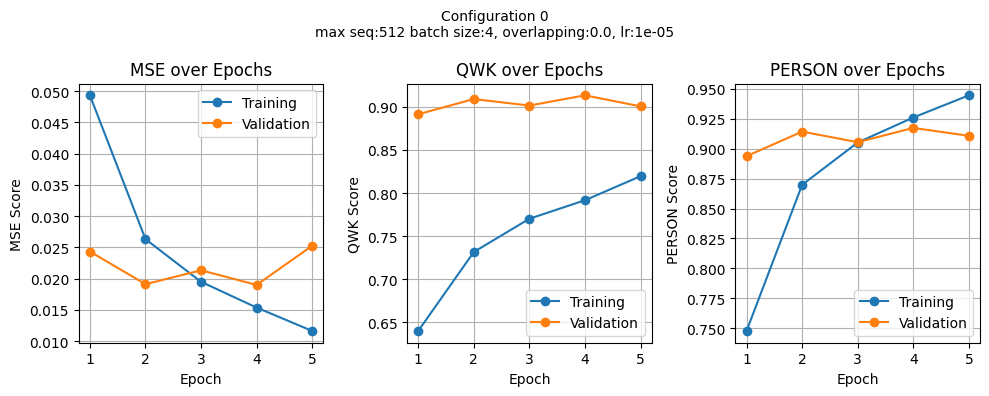

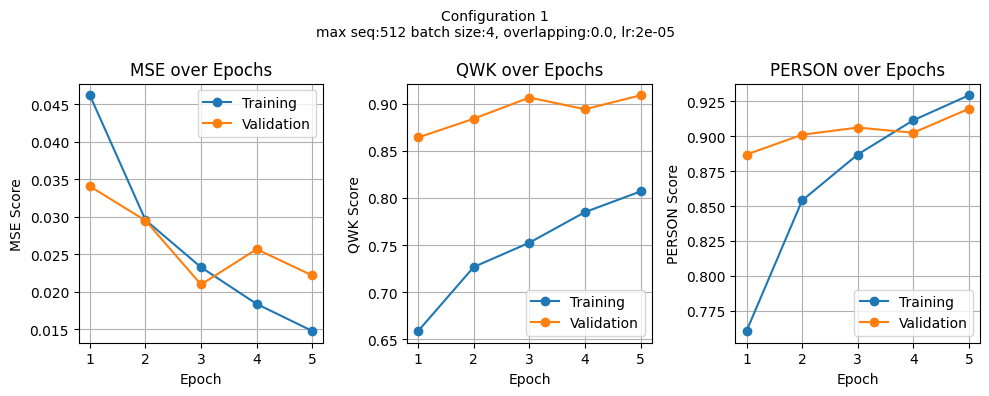

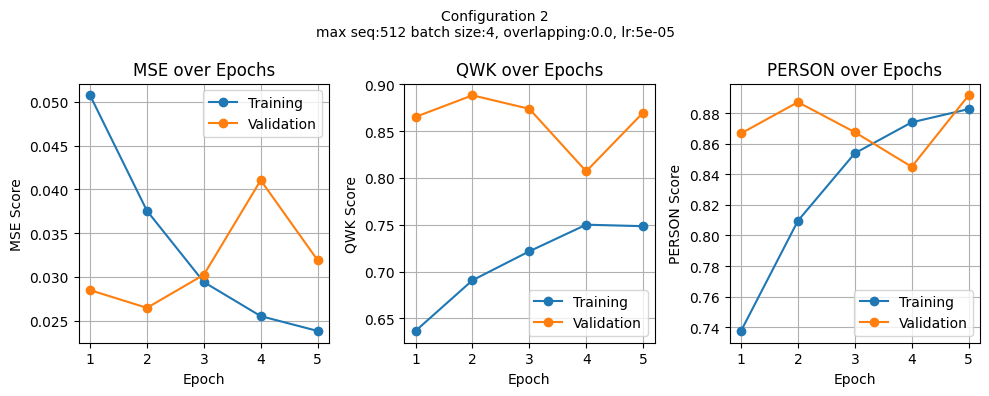

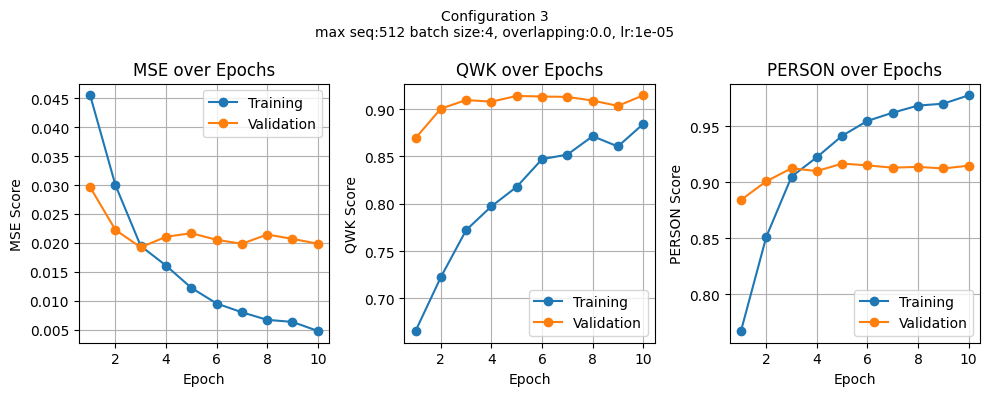

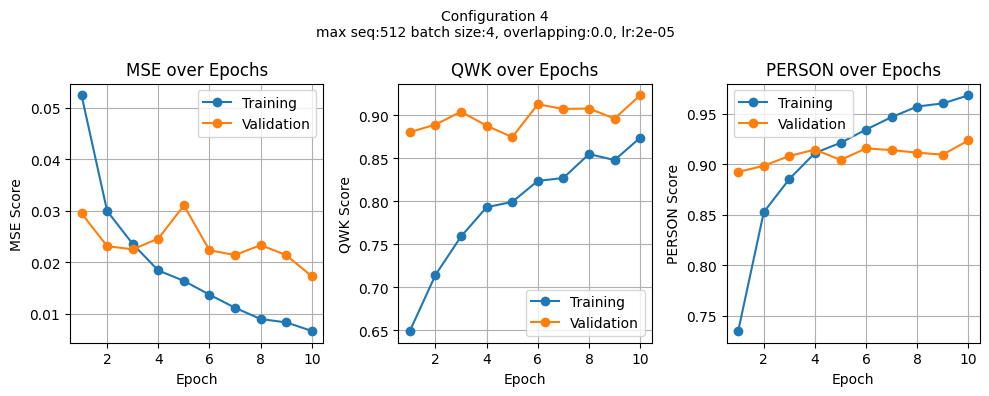

...

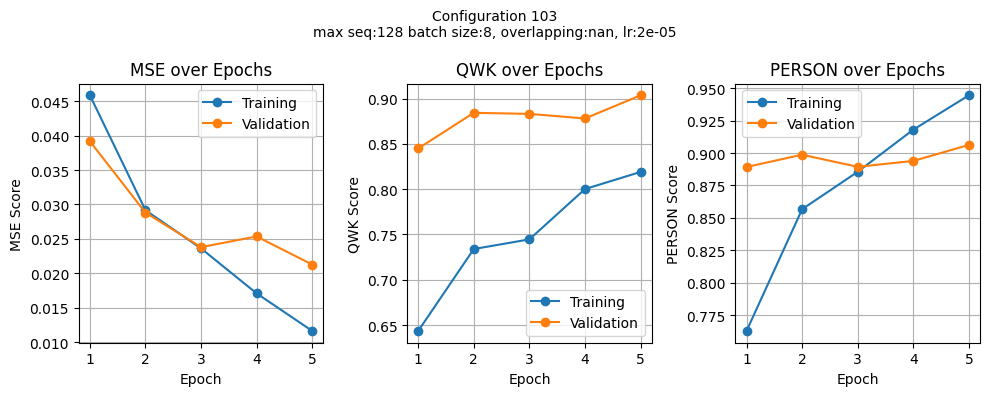

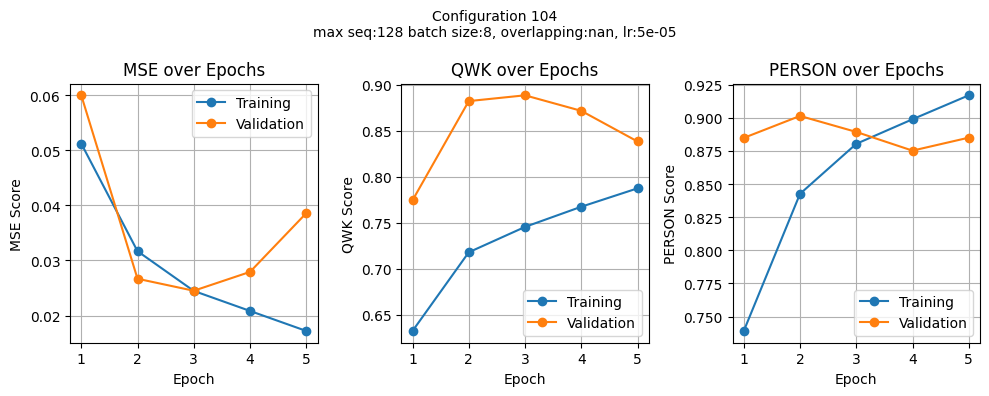

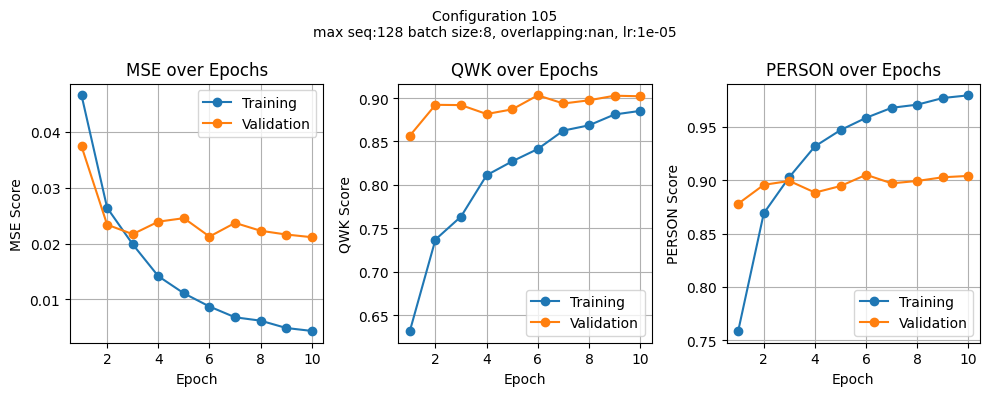

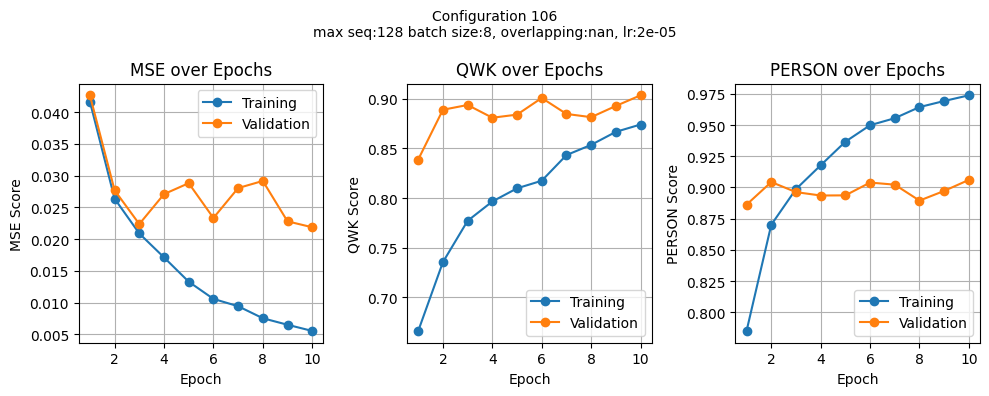

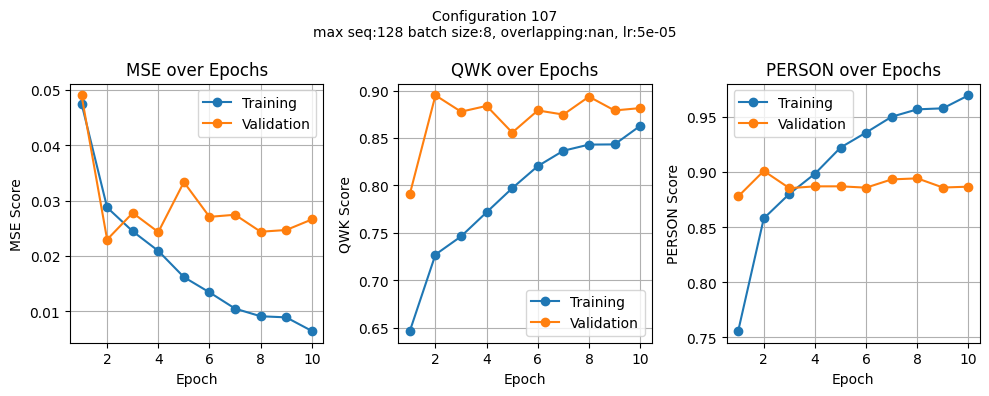

In [21]:
def plot_experiment_results(df, config_df):
    # Get unique configurations
    configs = df['config_id'].unique()
    
    # Metrics pairs to plot
    metrics = [
        ('mse', 'train_mse', 'valid_mse'),
        ('qwk', 'train_qwk', 'valid_qwk'),
        ('person', 'train_pearson', 'valid_pearson')
    ]
    
    # Create plots for each configuration
    for config, index in enumerate(configs):
        config_data = df[df['config_id'] == config]
        data = config_df[config_df['config_id'] == config]

        # Create a figure with 3 subplots (one for each metric)
        fig, axes = plt.subplots(1, 3, figsize=(10, 4))
        fig.suptitle(f'Configuration {config}\nmax seq:{data["max_seq_len"][index]} batch size:{data["batch_size"][index]}, overlapping:{data["overlapping"][index]}, lr:{data["learning_rate"][index]}', fontsize=10)
        
        # Plot each metric
        for idx, (metric_name, train_col, valid_col) in enumerate(metrics):
            ax = axes[idx]
            
            # Plot training and validation lines
            ax.plot(config_data['epoch'], config_data[train_col], 
                   label='Training', marker='o')
            ax.plot(config_data['epoch'], config_data[valid_col], 
                   label='Validation', marker='o')
            
            ax.set_xlabel('Epoch')
            ax.set_ylabel(f'{metric_name.upper()} Score')
            ax.set_title(f'{metric_name.upper()} over Epochs')
            ax.grid(True)
            ax.legend()
        
        plt.tight_layout()
        plt.show()

plot_experiment_results(epoch_df, config_df)

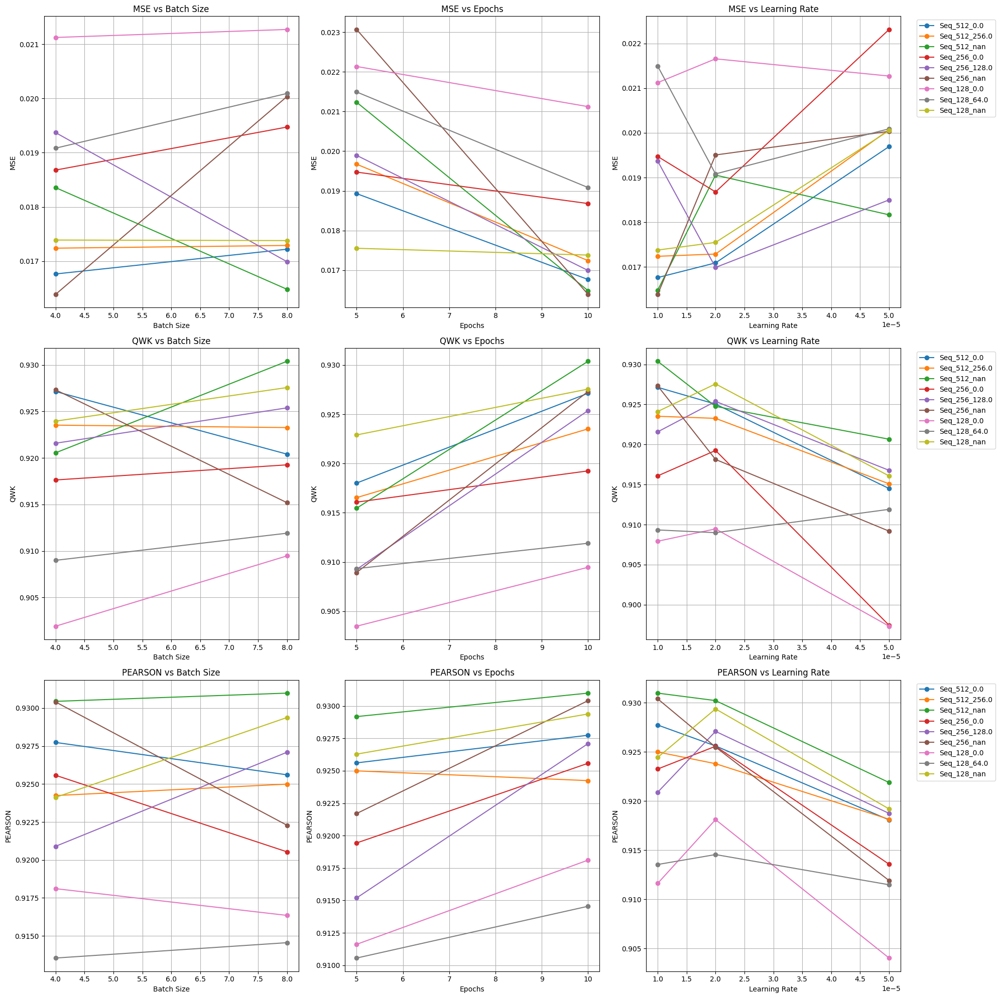

In [23]:
def create_performance_plots(df):
    # Create a category column combining max_seq_len and overlapping
    df['category'] = df['max_seq_len'].astype(str) + '_' + df['overlapping'].astype(str)
    
    # Create figure with 3x3 subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 20))
    
    # Parameters and metrics to plot
    parameters = ['batch_size', 'epochs', 'learning_rate']
    metrics = {
        'test_mse': 'min',     # Lower MSE is better
        'test_qwk': 'max',     # Higher QWK is better
        'test_pearson': 'max'  # Higher Pearson is better
    }
    
    # Create all combinations of plots
    for i, metric in enumerate(metrics.keys()):
        for j, param in enumerate(parameters):
            ax = axes[i, j]
            
            # Plot for each category
            for category in df['category'].unique():
                category_data = df[df['category'] == category]
                # Group by parameter and get the best performance for the metric
                grouped = category_data.groupby(param).agg({
                    metric: metrics[metric]
                }).reset_index()
                
                ax.plot(grouped[param], grouped[metric], marker='o', label=f'Seq_{category}')
            
            # Set labels and title
            ax.set_xlabel(param.replace('_', ' ').title())
            ax.set_ylabel(metric.replace('test_', '').upper())
            ax.set_title(f'{metric.replace("test_", "").upper()} vs {param.replace("_", " ").title()}')
            ax.grid(True)
            
            # Add legend to rightmost plots
            if j == 2:
                ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            
            # Format x-axis for learning rate to use scientific notation
            if param == 'learning_rate':
                ax.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    return fig

fig = create_performance_plots(config_df)
plt.show()

In [25]:
def analyze_best_configurations(df):
    # Create category column
    df['category'] = df['max_seq_len'].astype(str) + '_' + df['overlapping'].astype(str)
    
    # Group by category and get the configuration with best QWK
    best_configs = df.loc[df.groupby('category')['test_qwk'].idxmax()]
    
    # Sort by QWK to see best performing configurations first
    best_configs = best_configs.sort_values('test_qwk', ascending=False)
    
    # Create a summary DataFrame with relevant metrics and parameters
    summary = best_configs[[
        'category', 'max_seq_len', 'overlapping',
        'batch_size', 'epochs', 'learning_rate',
        'test_qwk', 'test_mse', 'test_pearson'
    ]].copy()
    
    # Return the summary DataFrame for further analysis if needed
    return summary

analyze_best_configurations(config_df)

,category,max_seq_len,overlapping,batch_size,epochs,learning_rate,test_qwk,test_mse,test_pearson
33,512_nan,512,NaN,8,10,0.00001,0.930384,0.016483,0.930986
106,128_nan,128,NaN,8,10,0.00002,0.927561,0.017643,0.929380
63,256_nan,256,NaN,4,10,0.00001,0.927318,0.016389,0.930405
3,512_0.0,512,0.0,4,10,0.00001,0.927136,0.016765,0.927738
58,256_128.0,256,128.0,8,10,0.00002,0.925379,0.016992,0.927094
15,512_256.0,512,256.0,4,10,0.00001,0.923522,0.017241,0.924240
46,256_0.0,256,0.0,8,10,0.00002,0.919254,0.019652,0.920535
95,128_64.0,128,64.0,8,10,0.00005,0.911906,0.020091,0.911479
82,128_0.0,128,0.0,8,10,0.00002,0.909466,0.021655,0.916348
